# Comparing SHAP across different backbone models

## 0.Load libraries

In [1]:
! pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt

import shap
import tensorflow as tf
import tensorflow.compat.v1.keras.backend as K

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions
# import keras.backend as K
tf.compat.v1.disable_eager_execution()

import torch, torchvision
from torch import nn
from torchvision import transforms, models, datasets

from keras.preprocessing import image
import keras.utils as image
from keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.utils import img_to_array

# SHAP

In [3]:
#load data
X,y = shap.datasets.imagenet50()

# load the ImageNet 1K class names
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
fname = shap.datasets.cache(url)
with open(fname) as f:
    class_names_1K = json.load(f)

# load the ImageNet 22K class names
# https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt
url = "https://storage.googleapis.com/bit_models/imagenet21k_wordnet_ids.txt"
fname = shap.datasets.cache(url)
with open(fname) as f:
  wordnet_id = [i.strip("\n") for i in f.readlines()]


#imagenet22K wordnetID
url = "https://storage.googleapis.com/bit_models/imagenet21k_wordnet_lemmas.txt"
fname = shap.datasets.cache(url)
with open(fname) as f:
  class_names = [i.strip("\n") for i in f.readlines()]
    # class_names = json.load(f)

#mapping predictions to imagenet2K labels
res = {}
for key in wordnet_id:
    for value in class_names:
        res[key] = value
        class_names.remove(value)
        break

In [4]:
def reshape_img(to_explain):
  img = image.img_to_array(to_explain).astype('float32')/255
  # img = img_to_array(img).astype('float32')/255
  img = np.expand_dims(img, axis=0)
  return(img)

def normalize_img(to_explain):
  norm_img = image.img_to_array(to_explain)# Transforming the image to get the shape as [channel, height, width]
  norm_img = np.expand_dims(norm_img, axis=0) # Adding dimension to convert array into a batch of size (1,299,299,3)
  norm_img = norm_img/255.0
  return(norm_img)

In [5]:
import os

! pwd
os.chdir('/content/drive/MyDrive/xml_SHAP')
! pwd

/content
/content/drive/MyDrive/xml_SHAP


## VGG16

In [12]:
# load pre-trained model
model_vgg16 = VGG16(weights='imagenet', include_top=True)

553467096/553467096 [==============================] - 3s 0us/step


In [13]:
# explain how the input to the 7th layer of the model explains the top two classes
def map2layer(x, layer):
    feed_dict = dict(zip([model_vgg16.layers[0].input], [preprocess_input(x.copy())]))
    return K.get_session().run(model_vgg16.layers[layer].input, feed_dict)

e = shap.GradientExplainer((model_vgg16.layers[7].input, model_vgg16.layers[-1].output), map2layer(preprocess_input(X.copy()), 7))


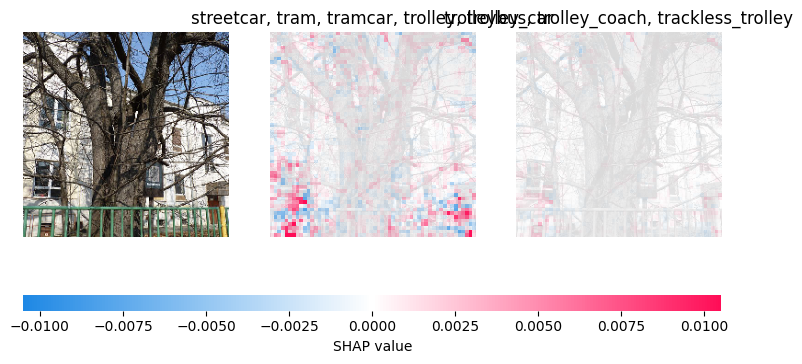

<Figure size 640x480 with 0 Axes>

In [14]:
to_explain = X[[0]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=2)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

plt.savefig('shap_vgg16_' +str(0)+ '.png')

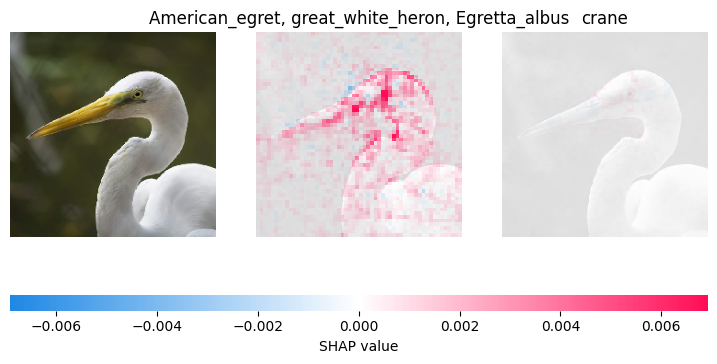

<Figure size 640x480 with 0 Axes>

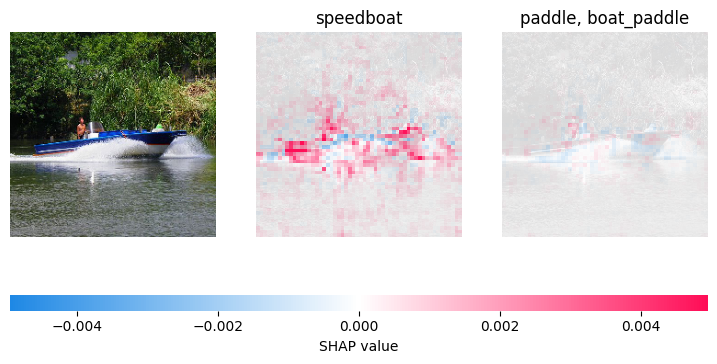

<Figure size 640x480 with 0 Axes>

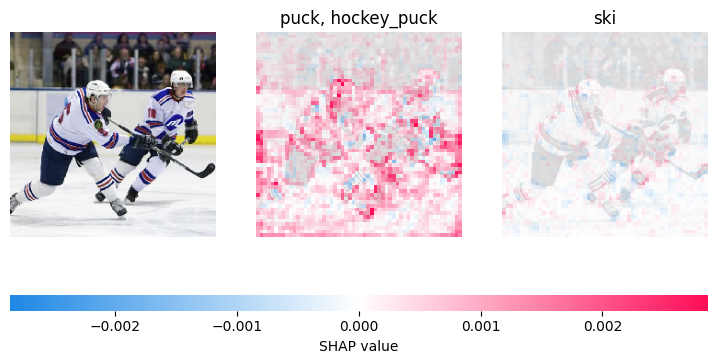

<Figure size 640x480 with 0 Axes>

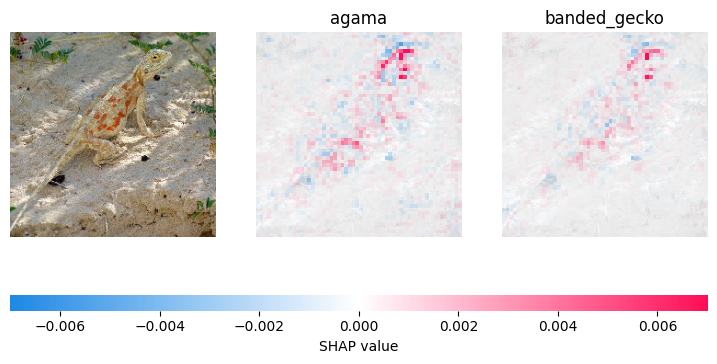

<Figure size 640x480 with 0 Axes>

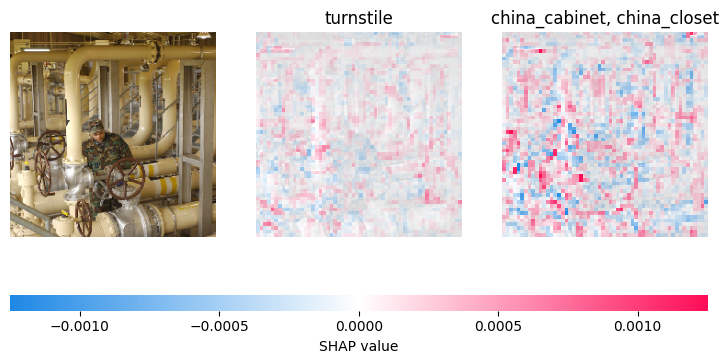

<Figure size 640x480 with 0 Axes>

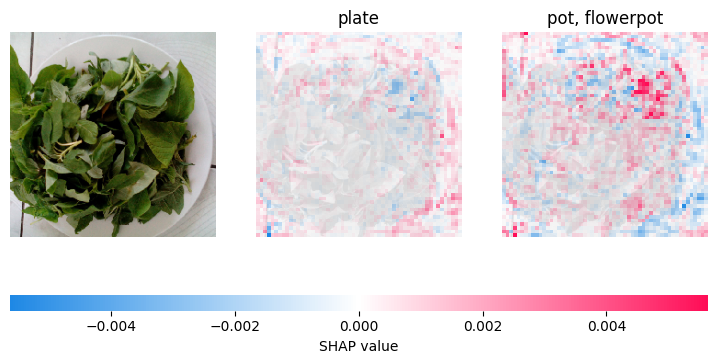

<Figure size 640x480 with 0 Axes>

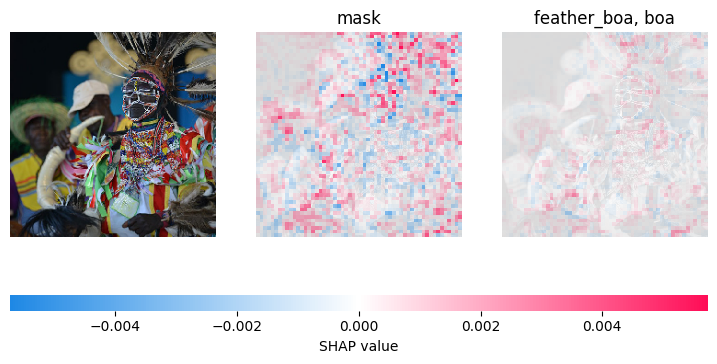

<Figure size 640x480 with 0 Axes>

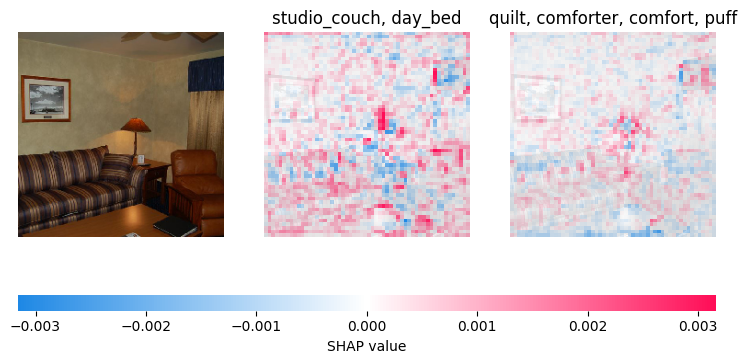

<Figure size 640x480 with 0 Axes>

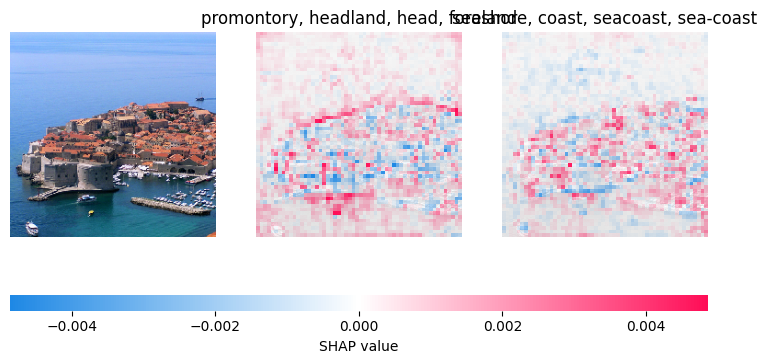

<Figure size 640x480 with 0 Axes>

In [15]:
for i in range(1,10):
  to_explain = X[[i]]

  shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=2)

  # get the names for the classes from imagenet 1K labels
  index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
  index_names_1K = index_names_1K.tolist()[0]

  #map to imagenet 22K labels
  class_names_22K = [res[key] for key in index_names_1K] 

  # plot the explanations
  shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

  plt.savefig('shap_vgg16_' +str(i)+ '.png')

### imagenet22K test

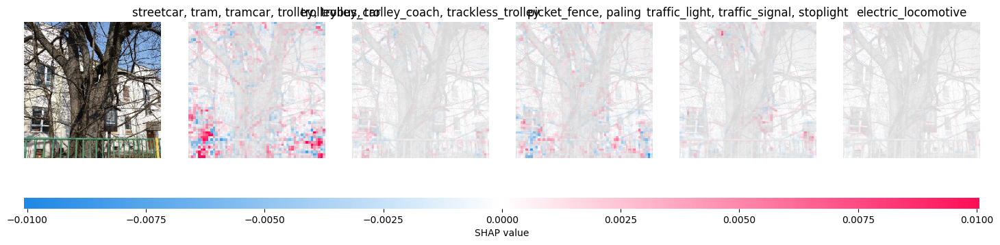

In [59]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[0]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

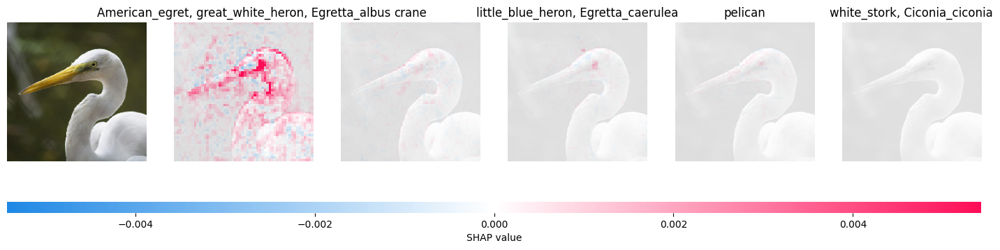

In [60]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[1]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

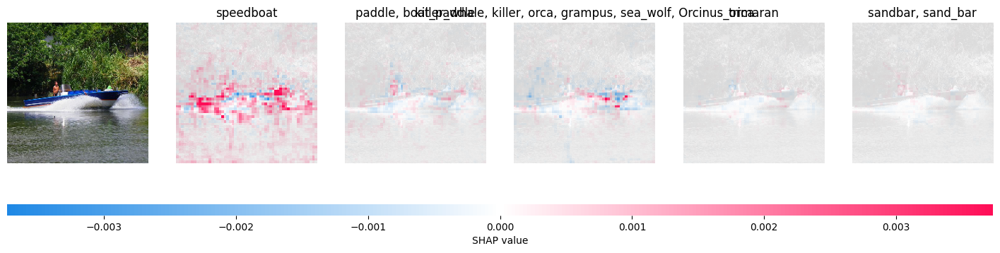

In [61]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[2]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

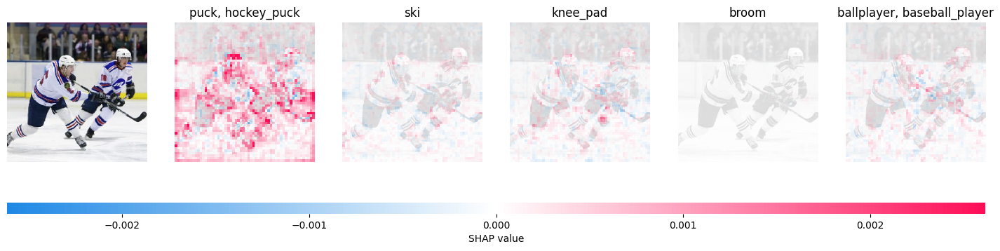

In [62]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[3]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

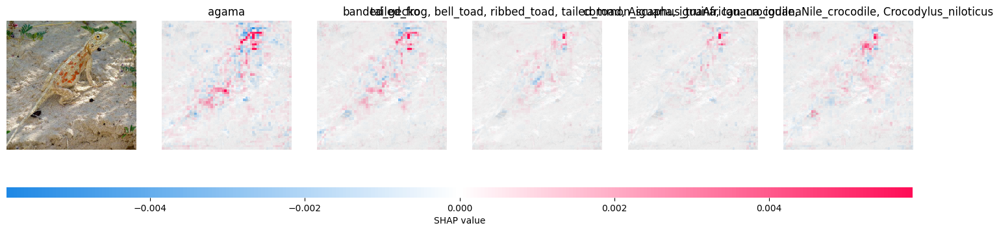

In [63]:
#imagenet 22K
# plt.imshow(X[1].astype(int))
to_explain = X[[4]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), class_names_22K)

### mapping 1K to 22K

In [55]:
# class_names_1K
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]


['n02009912', 'n02012849', 'n02009229', 'n02051845', 'n02002556']

In [57]:
# index_names_1K = keys
class_names_22K = [res[key] for key in index_names_1K]
class_names_22K

['American_egret, great_white_heron, Egretta_albus',
 'crane',
 'little_blue_heron, Egretta_caerulea',
 'pelican',
 'white_stork, Ciconia_ciconia']

### 1K Testing

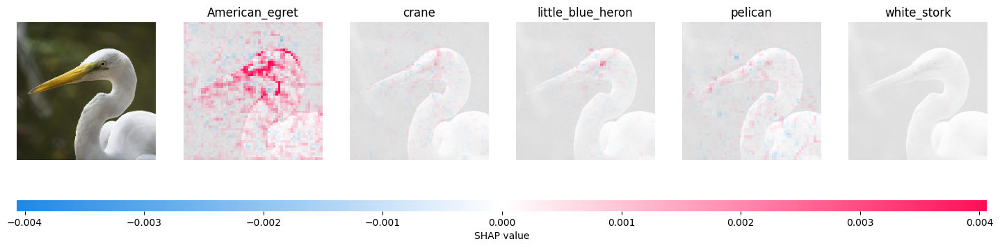

In [11]:
#imagenet1K
# plt.imshow(X[1].astype(int))
to_explain = X[[1]]

shap_values,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes
index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

# plot the explanations
shap.image_plot(shap_values, to_explain.astype(int), index_names)

## Resnet50

In [4]:
X,y = shap.datasets.imagenet50()

In [23]:
model_resnet50 = ResNet50(weights='imagenet')

Instructions for updating:
Colocations handled automatically by placer.


102967424/102967424 [==============================] - 1s 0us/step


In [24]:
# resnet50 - last global average pooling layer= 49th layer
def map2layer(x, layer):
    feed_dict = dict(zip([model_resnet50.layers[0].input], [preprocess_input(x.copy())]))
    return K.get_session().run(model_resnet50.layers[layer].input, feed_dict)

In [25]:
e = shap.GradientExplainer((model_resnet50.layers[49].input, model_resnet50.layers[-1].output), map2layer(preprocess_input(X.copy()), 49))

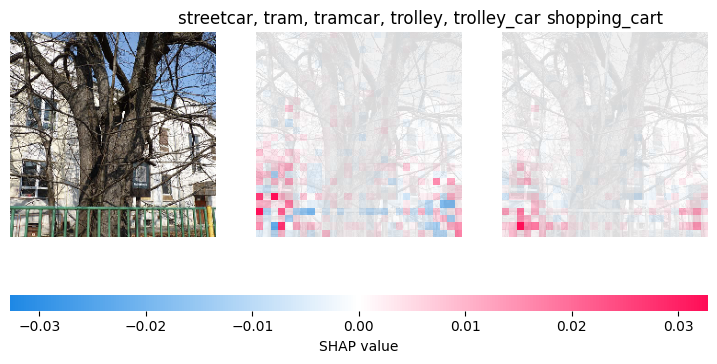

<Figure size 640x480 with 0 Axes>

In [26]:
#on layer 49 of resnet50
#imagenet 22K

to_explain = X[[0]]
shap_values,indexes = e.shap_values(map2layer(to_explain, 49), ranked_outputs=2)

# # get the names for the classes
# index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

# shap.image_plot(shap_values[0], to_explain.astype(int), index_names)

# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

# plot the explanations
shap.image_plot(shap_values[0], to_explain.astype(int), class_names_22K)
plt.savefig('shap_resnet50_' +str(0)+ '.png')

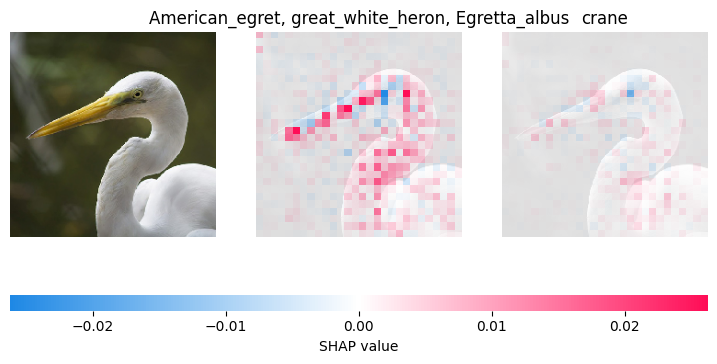

<Figure size 640x480 with 0 Axes>

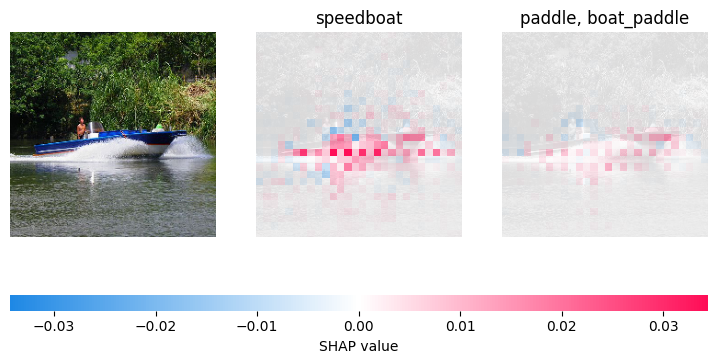

<Figure size 640x480 with 0 Axes>

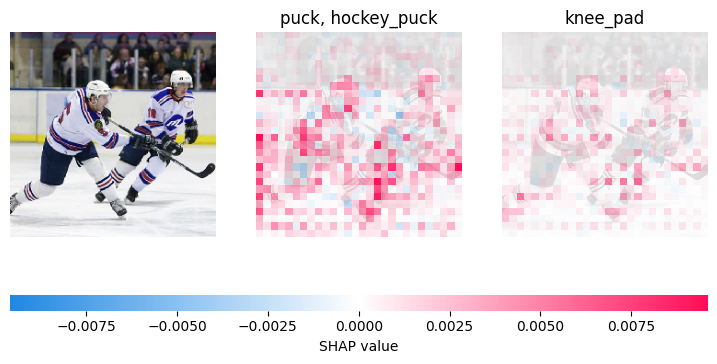

<Figure size 640x480 with 0 Axes>

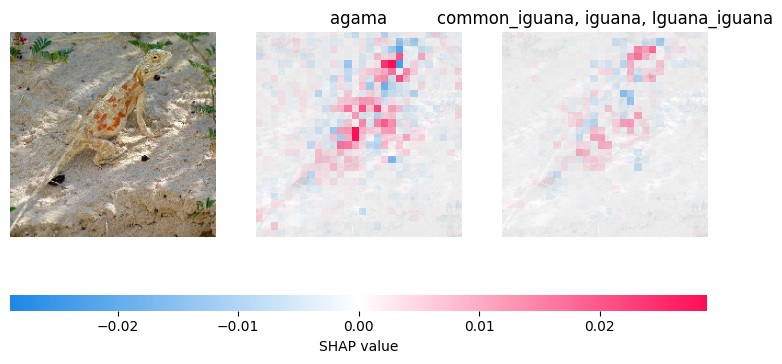

<Figure size 640x480 with 0 Axes>

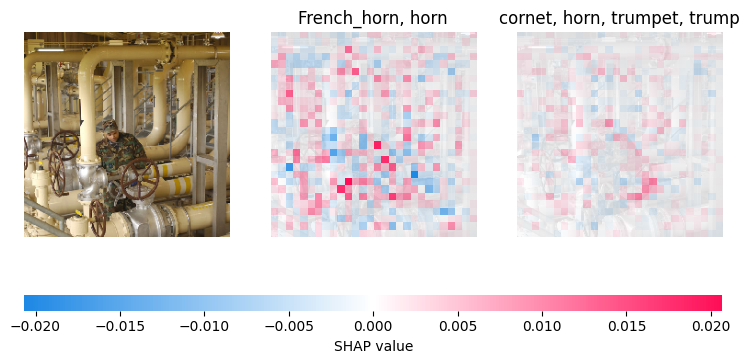

<Figure size 640x480 with 0 Axes>

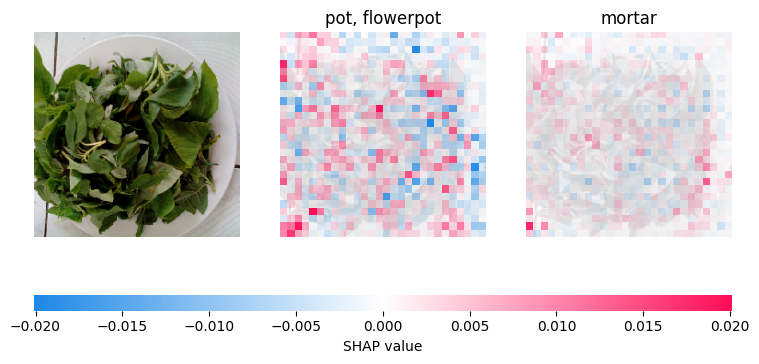

<Figure size 640x480 with 0 Axes>

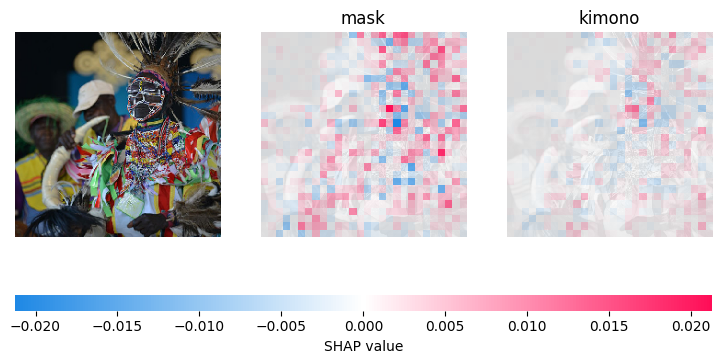

<Figure size 640x480 with 0 Axes>

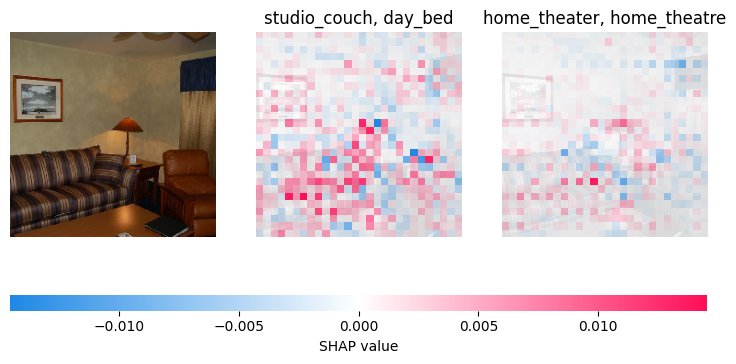

<Figure size 640x480 with 0 Axes>

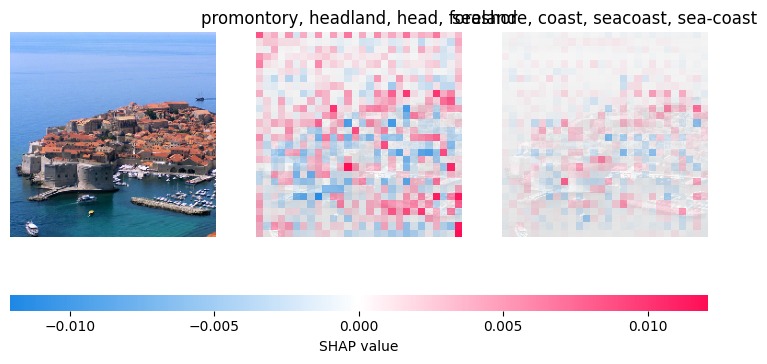

<Figure size 640x480 with 0 Axes>

In [29]:
for i in range(1,10):
    #on layer 49 of resnet50
    #imagenet 22K

    to_explain = X[[i]]
    shap_values,indexes = e.shap_values(map2layer(to_explain, 49), ranked_outputs=2)

    # # get the names for the classes
    # index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

    # shap.image_plot(shap_values[0], to_explain.astype(int), index_names)

    # get the names for the classes from imagenet 1K labels
    index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
    index_names_1K = index_names_1K.tolist()[0]

    #map to imagenet 22K labels
    class_names_22K = [res[key] for key in index_names_1K] 

    # plot the explanations
    shap.image_plot(shap_values[0], to_explain.astype(int), class_names_22K)
    plt.savefig('shap_resnet50_' +str(i)+ '.png')

#### Resnet50- imagenet1K

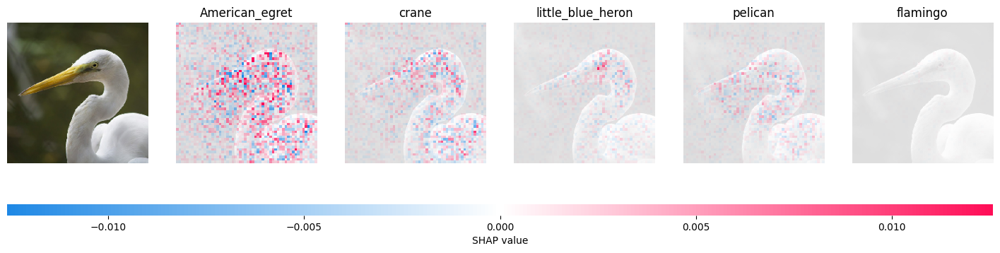

In [39]:
#on layer 7 of resnet50
to_explain = X[[1]]
shap_values_7,indexes = e.shap_values(map2layer(to_explain, 7), ranked_outputs=5)

# get the names for the classes
index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

# plot the explanations
shap.image_plot(shap_values_7, to_explain.astype(int), index_names)

In [35]:
# array = np.array(shap_values)

# # # Reshape the array to have a batch size of 1
# array = np.reshape(array, (1,) + array.shape)

# # # Reshape the array to a 4D tensor
# array = np.reshape(array, (5*2, 1, 28, 28*512))


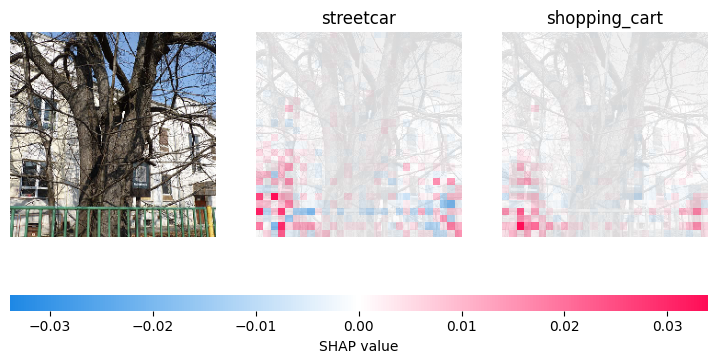

In [92]:
#on layer 49 of resnet50
to_explain = X[[0]]
shap_values,indexes = e.shap_values(map2layer(to_explain, 49), ranked_outputs=2)

# get the names for the classes
index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

shap.image_plot(shap_values[0], to_explain.astype(int), index_names)

In [ ]:
e = shap.GradientExplainer((model_resnet50.layers[49].input, model_resnet50.layers[-1].output), map2layer(preprocess_input(X.copy()), 49))

#on layer 49 of resnet50
to_explain = X[[1]]
shap_values,indexes = e.shap_values(map2layer(to_explain, 49), ranked_outputs=5)

# get the names for the classes
index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

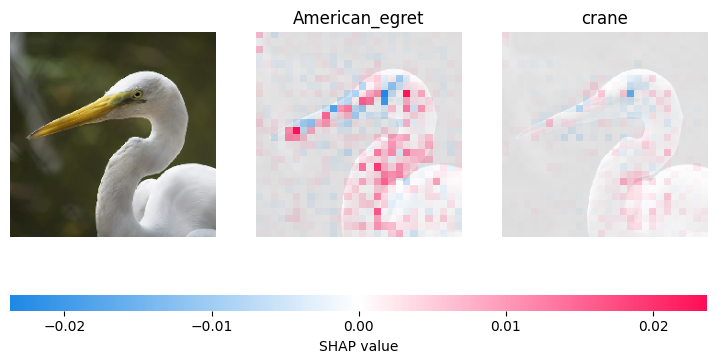

In [66]:
# plot the explanations
shap.image_plot(shap_values[0], to_explain.astype(int), index_names)

In [73]:
X,y = shap.datasets.imagenet50()

In [ ]:
#on layer 49 of resnet50
to_explain = X[[2]]
shap_values,indexes = e.shap_values(map2layer(to_explain, 49), ranked_outputs=2)

# get the names for the classes
index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

shap.image_plot(shap_values[0], to_explain.astype(int), index_names)

In [67]:
# layer_index = 49

# samples = 20
# e = shap.GradientExplainer((model_resnet50, model_resnet50.features[layer_index]), normalize(X))
# shap_values,indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

# index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)
# index_names

# shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]

# shap.image_plot(shap_values, to_explain, index_names)


In [ ]:
# Get a sample image from the dataset and preprocess it
image, _ = val_dataset[0]
input = image.unsqueeze(0)

# Generate SHAP values for the input image
shap_values, _ = explainer.shap_values(input)

# Visualize the SHAP values
shap.image_plot(shap_values, ...)

## Densenet121

In [6]:
X,y = shap.datasets.imagenet50()

In [7]:
import torch
# from torchvision import transforms

model_densenet121 = torch.hub.load('pytorch/vision:v0.10.0', 'densenet121', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.


In [8]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def normalize(image):
    if image.max() > 1:
        image /= 255
    image = (image - mean) / std
    return torch.tensor(image.swapaxes(-1, 1).swapaxes(2, 3)).float()

In [25]:
len(model_densenet121.features)

12

In [9]:
#layer 7
layer_index = 7
e = shap.GradientExplainer((model_densenet121, model_densenet121.features[layer_index]), normalize(X), local_smoothing=0.5)

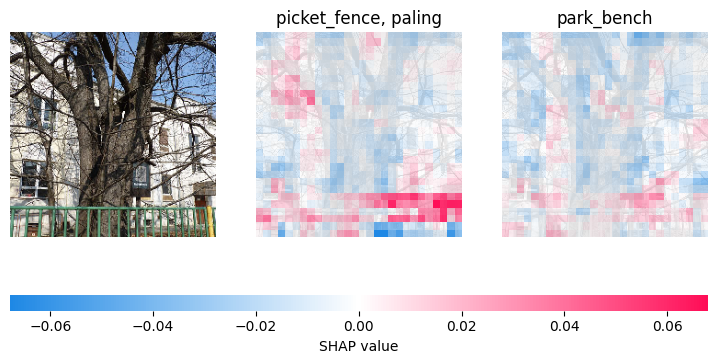

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-1208aaec83d9>", line 17, in <cell line: 17>
    plt.savefig('shap_resnet50_' +str(0)+ '.png')
  File "/usr/local/lib/python3.10/dist-packages/matplotlib/pyplot.py", line 1023, in savefig
    res = fig.savefig(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/matplotlib/figure.py", line 3343, in savefig
    self.canvas.print_figure(fname, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/matplotlib/backend_bases.py", line 2366, in print_figure
    result = print_method(
  File "/usr/local/lib/python3.10/dist-packages/matplotlib/backend_bases.py", line 2232, in <lambda>
    print_method = functools.wraps(meth)(lambda *args, **kwargs: meth(
  File "/usr/local/lib/python3.10/dist-packages/matplotlib/backends/backend_agg.py", line 509, in print_png
  

<Figure size 640x480 with 0 Axes>

In [ ]:
#imagenet22K, layer 7

to_explain = X[[0]]
samples = 200
shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

# index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)
# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, class_names_22K)
plt.savefig('shap_densenet121_' +str(0)+ '.png')

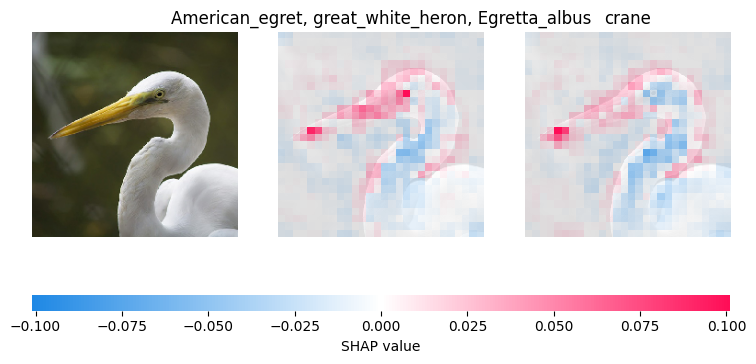

<Figure size 640x480 with 0 Axes>

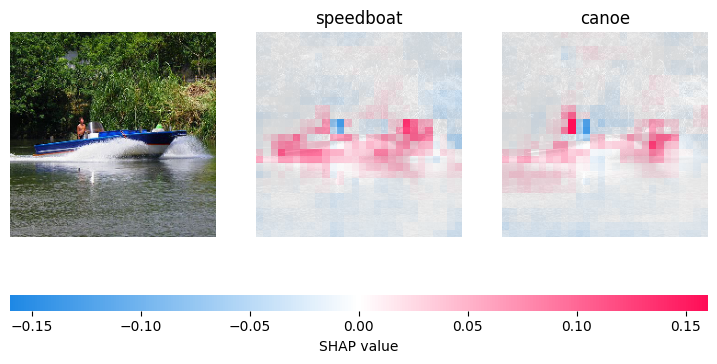

<Figure size 640x480 with 0 Axes>

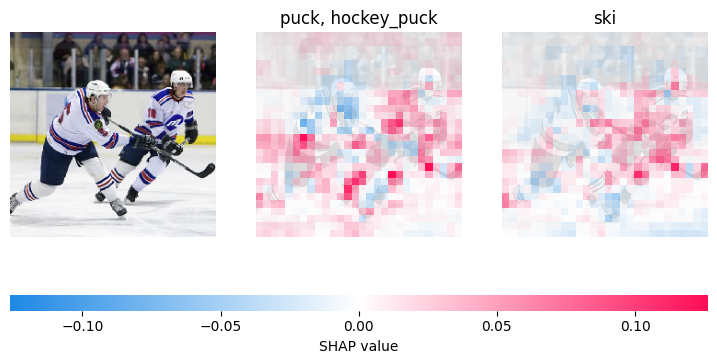

<Figure size 640x480 with 0 Axes>

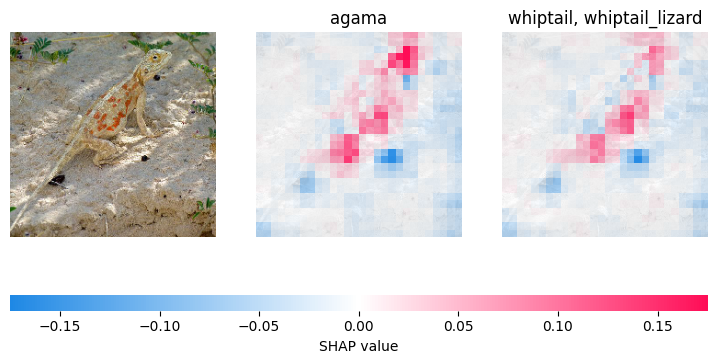

<Figure size 640x480 with 0 Axes>

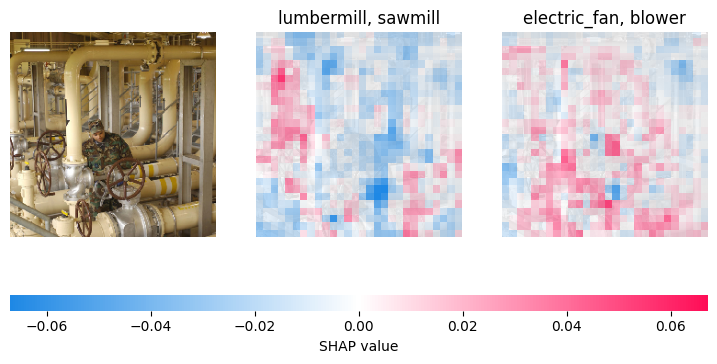

<Figure size 640x480 with 0 Axes>

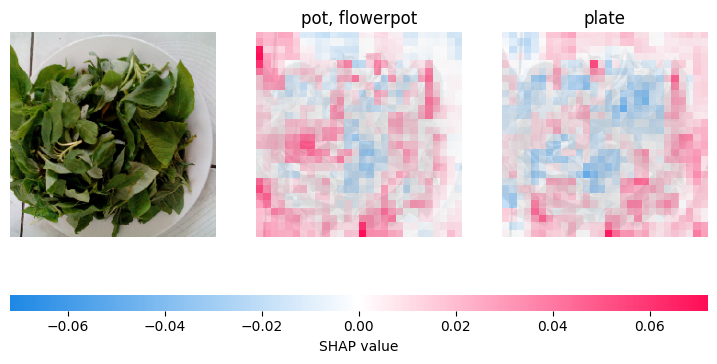

<Figure size 640x480 with 0 Axes>

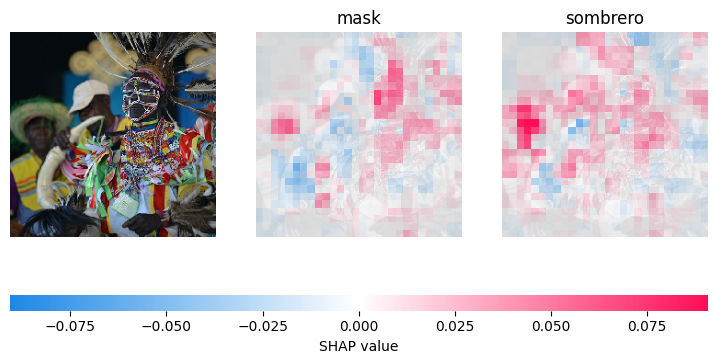

<Figure size 640x480 with 0 Axes>

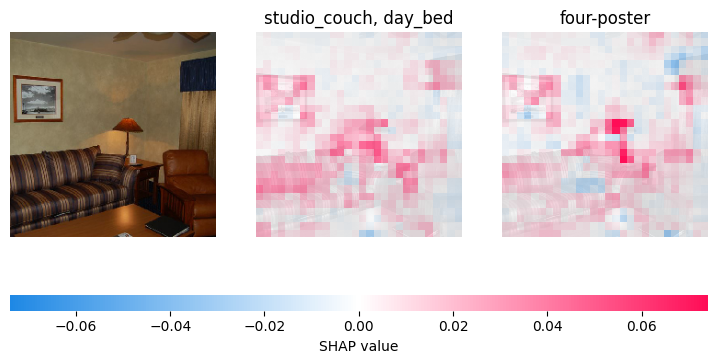

<Figure size 640x480 with 0 Axes>

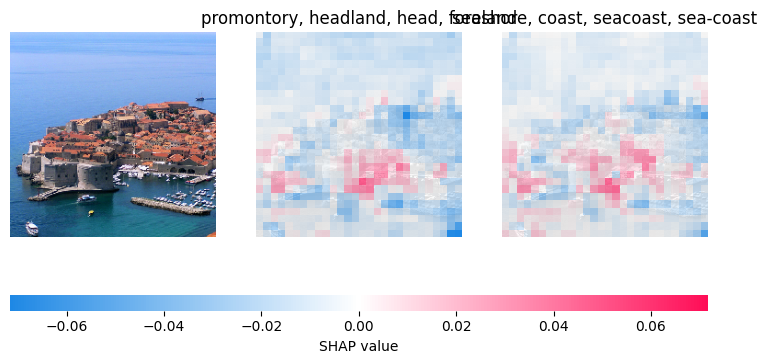

<Figure size 640x480 with 0 Axes>

In [10]:
#imagenet22K, layer 7
for i in range(1,10):
    to_explain = X[[i]]
    samples = 100
    shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

    # index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)
    # get the names for the classes from imagenet 1K labels
    index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
    index_names_1K = index_names_1K.tolist()[0]

    #map to imagenet 22K labels
    class_names_22K = [res[key] for key in index_names_1K] 

    shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
    shap.image_plot(shap_values, to_explain, class_names_22K)
    plt.savefig('shap_densenet121_' +str(i)+ '.png')

### densenet experimentations with intermediate layers

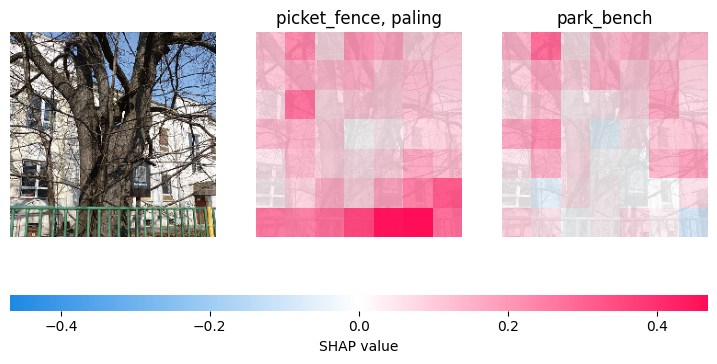

In [14]:
#imagenet22K, layer 10

to_explain = X[[0]]
samples = 200
shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

# index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)
# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, class_names_22K)

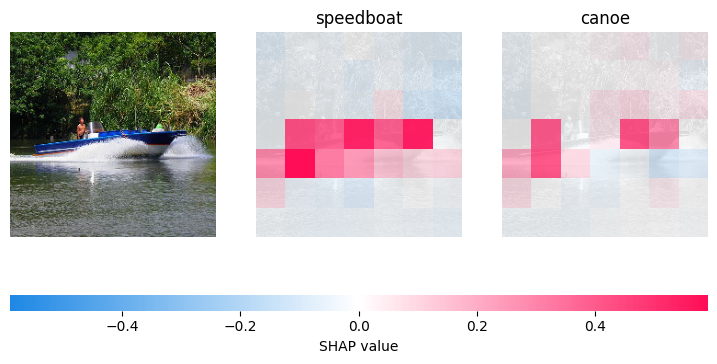

In [15]:
#imagenet22K, layer 10

to_explain = X[[2]]
samples = 200
shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

# index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)
# get the names for the classes from imagenet 1K labels
index_names_1K = np.vectorize(lambda x: class_names_1K[str(x)][0])(indexes)
index_names_1K = index_names_1K.tolist()[0]

#map to imagenet 22K labels
class_names_22K = [res[key] for key in index_names_1K] 

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, class_names_22K)

### 1K Resnet

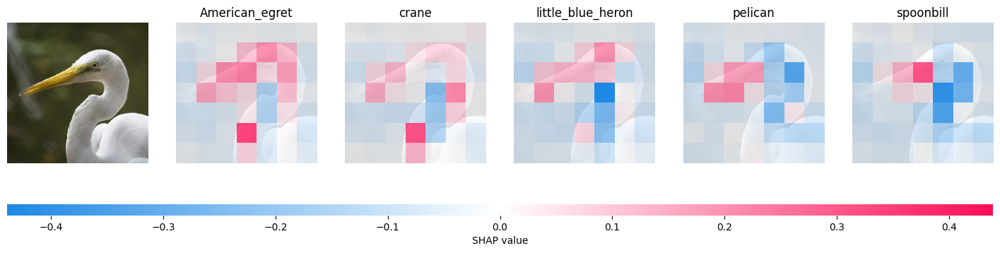

In [13]:
#imagenet1K, layer10
to_explain = X[[1]]

samples = 200
shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=5, nsamples=samples)

index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, index_names)

In [14]:
layer_index = 7
e = shap.GradientExplainer((model_densenet121, model_densenet121.features[layer_index]), normalize(X), local_smoothing=0.5)

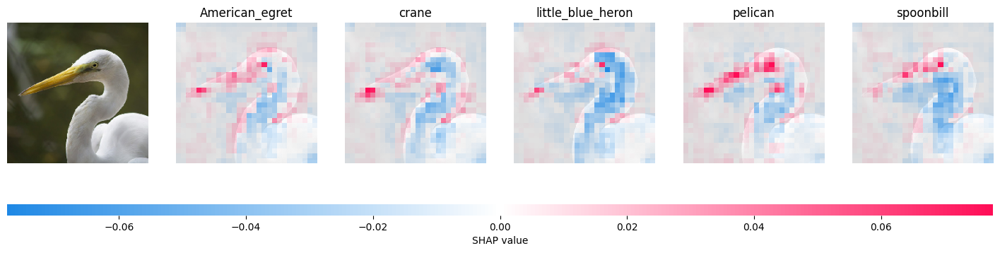

In [15]:
to_explain = X[[1]]

samples = 200
shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=5, nsamples=samples)

index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, index_names)

## Graveyard

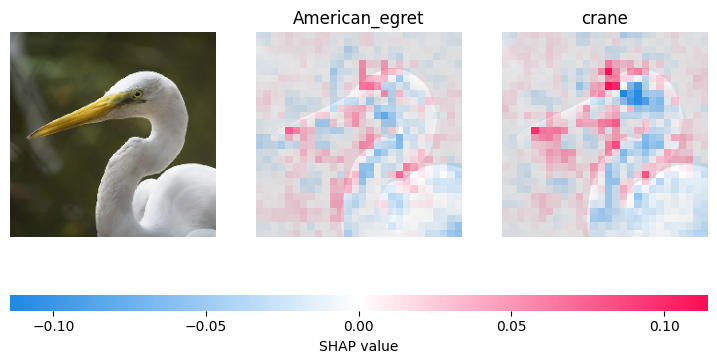

In [48]:
to_explain = X[[1]]

shap_values, indexes = e.shap_values(normalize(to_explain), ranked_outputs=2, nsamples=samples)

index_names = np.vectorize(lambda x: class_names[str(x)][1])(indexes)

shap_values = [np.swapaxes(np.swapaxes(s, 2, 3), 1, -1) for s in shap_values]
shap.image_plot(shap_values, to_explain, index_names)